# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing Libraries

In [ ]:
import torch
import os
import cv2
import os
import matplotlib.pyplot as plt

# Dataset Details

In [ ]:
# Define the folder path
folder_path = '/content/drive/MyDrive/MLR/S3R2-KIIT'
files = os.listdir(folder_path)

for file in files:
    print(file)

test
valid
train
S3R2_data.yml


In [ ]:
# Define the paths for train, valid, and test directories
base_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT'
dirs = ['train', 'valid', 'test']

for dir_name in dirs:
    dir_path = os.path.join(base_dir, dir_name)
    print(f"\nDirectory: {dir_name}")
    for subfolder in os.listdir(dir_path):
        subfolder_path = os.path.join(dir_path, subfolder)

        if os.path.isdir(subfolder_path):
            num_files = len([f for f in os.listdir(subfolder_path) if os.path.isfile(os.path.join(subfolder_path, f))])
            print(f"  Subfolder: {subfolder}, Number of files: {num_files}")



Directory: train
  Subfolder: labels, Number of files: 1360
  Subfolder: images, Number of files: 1360

Directory: valid
  Subfolder: labels, Number of files: 170
  Subfolder: images, Number of files: 170

Directory: test
  Subfolder: labels, Number of files: 170
  Subfolder: images, Number of files: 170


In [ ]:
yaml_file_path = '/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml'
with open(yaml_file_path, 'r') as file:
    yaml_content = file.read()

print(yaml_content)


names:
  - Artilary
  - Missile
  - Radar
  - M. Rocket Launcher
  - Soldier
  - Tank
  - Vehicle
nc: 7
train: /content/drive/MyDrive/MLR/S3R2-KIIT/train/images
val: /content/drive/MyDrive/MLR/S3R2-KIIT/test/images
test: /content/drive/MyDrive/MLR/S3R2-KIIT/valid/images



Let's see the information of a annotation file...

In [ ]:
import os

label_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/test/labels'
label_file = 'image_s3r2_kiit_116.txt'

label_path = os.path.join(label_dir, label_file)

if not os.path.exists(label_path):
    print(f"Label file not found: {label_path}")
else:
    with open(label_path, 'r') as f:
        lines = f.readlines()

    print(f"Label file: {label_file}")
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())

        print(f"Class ID: {int(class_id)}")
        print(f"Bounding Box: x_center={x_center}, y_center={y_center}, width={width}, height={height}")
        print("-" * 50)

Label file: image_s3r2_kiit_116.txt
Class ID: 5
Bounding Box: x_center=0.41594, y_center=0.568333, width=0.35438, height=0.234259
--------------------------------------------------


In [ ]:
# Class names as per our dataset
class_names = [
    "Artilary",             # ID 0
    "Missile",              # ID 1
    "Radar",                # ID 2
    "M. Rocket Launcher",   # ID 3
    "Soldier",              # ID 4
    "Tank",                 # ID 5
    "Vehicle"               # ID 6
]

# Visualization

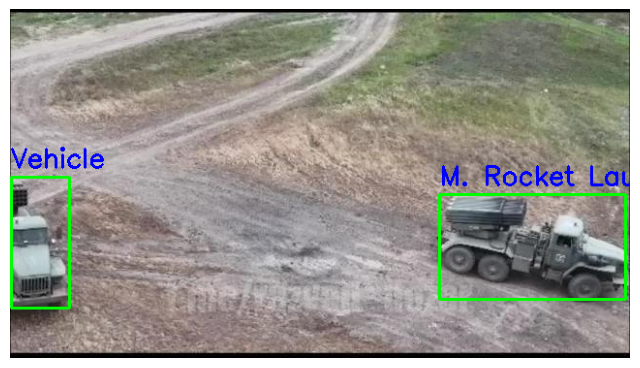

In [ ]:
image_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/test/images'
annotation_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/test/labels'

def visualize_image_with_annotations(image_name):
    image_path = os.path.join(image_dir, image_name)
    img = cv2.imread(image_path)

    if img is None:
        print(f"Image not found: {image_path}")
        return

    annotation_name = os.path.splitext(image_name)[0] + '.txt'
    annotation_path = os.path.join(annotation_dir, annotation_name)

    if not os.path.exists(annotation_path):
        print(f"Annotation not found: {annotation_path}")
        return

    img_height, img_width = img.shape[:2]

    with open(annotation_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())

        x_center = int(x_center * img_width)
        y_center = int(y_center * img_height)
        width = int(width * img_width)
        height = int(height * img_height)

        x_min = int(x_center - width / 2)
        y_min = int(y_center - height / 2)
        x_max = int(x_center + width / 2)
        y_max = int(y_center + height / 2)

        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=2)

        class_name = class_names[int(class_id)]

        cv2.putText(img, class_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

visualize_image_with_annotations('image_s3r2_kiit_1297.jpeg')  # Image to Visualize


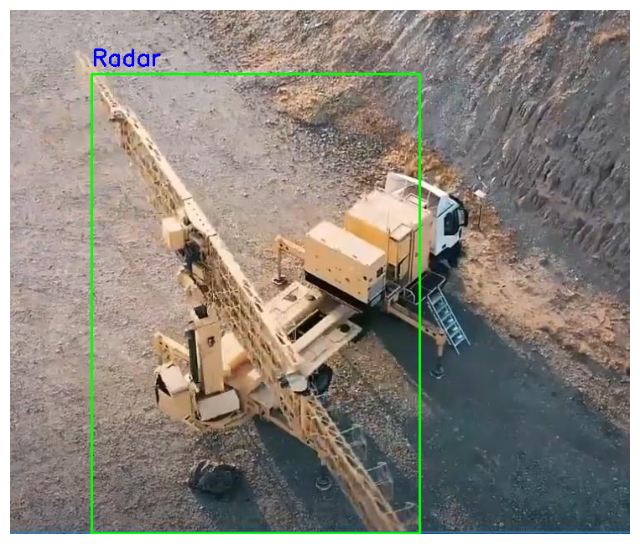

In [ ]:
visualize_image_with_annotations('image_s3r2_kiit_150.jpeg')

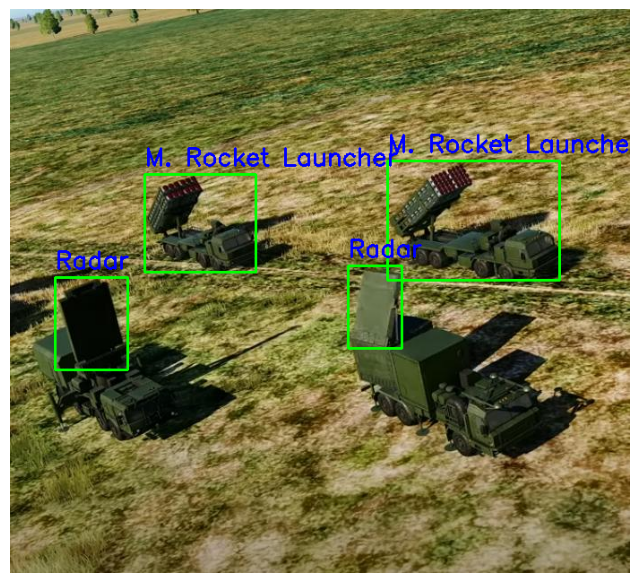

In [ ]:
visualize_image_with_annotations('image_s3r2_kiit_1591.jpeg')

# Cheking for GPU

In [ ]:
if torch.cuda.is_available():
    gpu_info = torch.cuda.get_device_properties(0)
    print(f"GPU is available: {gpu_info.name}")
    print(f"Total Memory: {gpu_info.total_memory / (1024**3):.2f} GB")
    print(f"CUDA Capability: {gpu_info.major}.{gpu_info.minor}")
else:
    print("GPU not available, running on CPU.")


GPU is available: Tesla T4
Total Memory: 14.75 GB
CUDA Capability: 7.5


In [ ]:
!nvidia-smi

Sun Nov  3 15:14:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Setting up YOLOV5 nano...

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 17022, done.
remote: Total 17022 (delta 0), reused 0 (delta 0), pack-reused 17022 (from 1)
Receiving objects: 100% (17022/17022), 15.61 MiB | 16.70 MiB/s, done.
Resolving deltas: 100% (11690/11690), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 25.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.3 MB/s eta 0:00:00
Setup complete. Using torch 2.5.0+cu121 (Tesla T4)


Using the YOLOv5_NANO model

In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data /content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml --cfg yolov5n.yaml --weights yolov5n.pt --name /content/drive/MyDrive/MLR/S3R2-KIIT --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      71/99      2.59G     0.0307    0.02404   0.006954         64        640:  54% 46/85 [00:14<00:09,  4.13it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      71/99      2.59G    0.03076    0.02404   0.006976         88        640:  55% 47/85 [00:14<00:09,  3.89it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      71/99      2.59G    0.03074    0.02407   0.006934         89        640:  56% 48/85 [00:15<00:09,  3.77it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):


In [ ]:
!python val.py --weights /content/drive/MyDrive/MLR/S3R2-KIIT3/weights/best.pt --data /content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml --img 640

val: data=/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml, weights=['/content/drive/MyDrive/MLR/S3R2-KIIT3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5n summary: 157 layers, 1768636 parameters, 0 gradients, 4.2 GFLOPs
val: Scanning /content/drive/MyDrive/MLR/S3R2-KIIT/test/labels.cache... 170 images, 0 backgrounds, 0 corrupt: 100% 170/170 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 6/6 [00:10<00:00,  1.72s/it]
                   all        170        419      0.654      0.641      0.651      0.387
              Artilary        170         40      0.

# Detection

Single Image

In [ ]:
!python detect.py --weights /content/drive/MyDrive/MLR/S3R2-KIIT3/weights/best.pt --img 640 --conf 0.1 --source /content/image_s3r2_kiit_90.jpeg

detect: weights=['/content/drive/MyDrive/MLR/S3R2-KIIT3/weights/best.pt'], source=/content/image_s3r2_kiit_90.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5n summary: 157 layers, 1768636 parameters, 0 gradients, 4.2 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/image_s3r2_kiit_90.jpeg: 512x640 1 Artilary, 1 Soldier, 26.8ms
Speed: 0.5ms pre-process, 26.8ms inference, 599.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp6


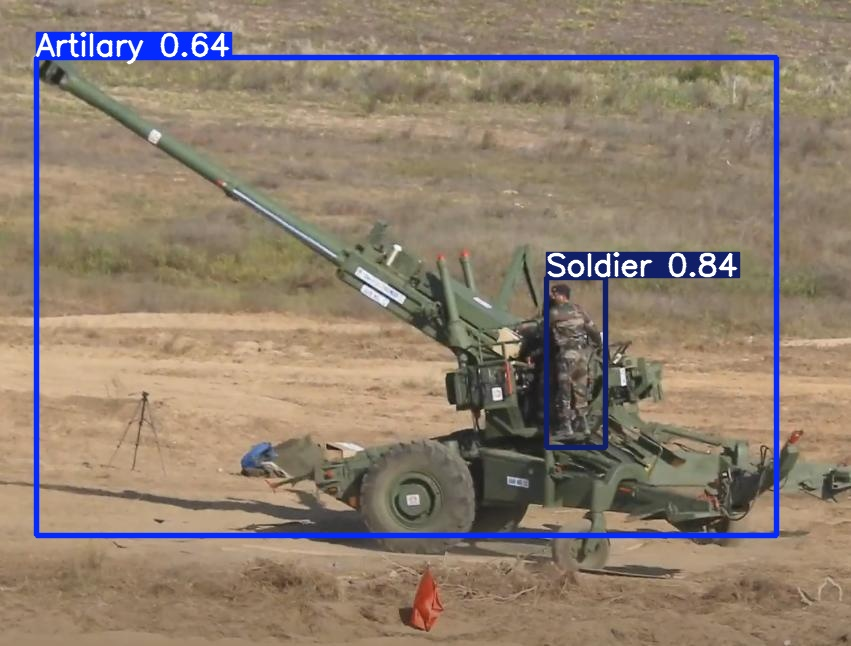

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp6/image_s3r2_kiit_90.jpeg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Multiple Image

In [ ]:
!python detect.py --weights /content/drive/MyDrive/MLR/S3R2-KIIT3/weights/best.pt --source /content/drive/MyDrive/MLR/test_images --img 640 --conf 0.25 --save-txt --save-conf

detect: weights=['/content/drive/MyDrive/MLR/S3R2-KIIT3/weights/best.pt'], source=/content/drive/MyDrive/MLR/test_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5n summary: 157 layers, 1768636 parameters, 0 gradients, 4.2 GFLOPs
image 1/11 /content/drive/MyDrive/MLR/test_images/M. Launcher.jpeg: 640x544 1 M. Rocket Launcher, 1 Soldier, 27.8ms
image 2/11 /content/drive/MyDrive/MLR/test_images/Missile_1.jpeg: 640x640 1 Missile, 7.1ms
image 3/11 /content/drive/MyDrive/MLR/test_images/Radar.jpeg: 480x

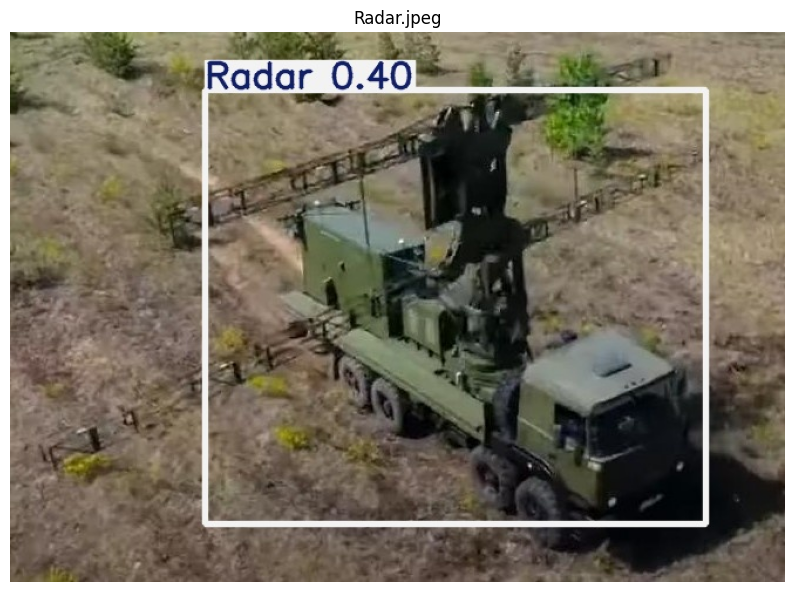

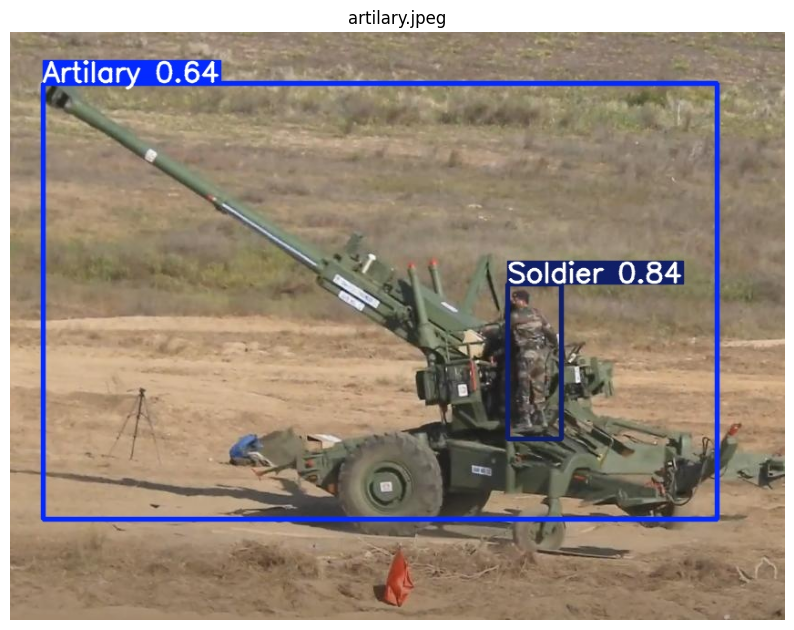

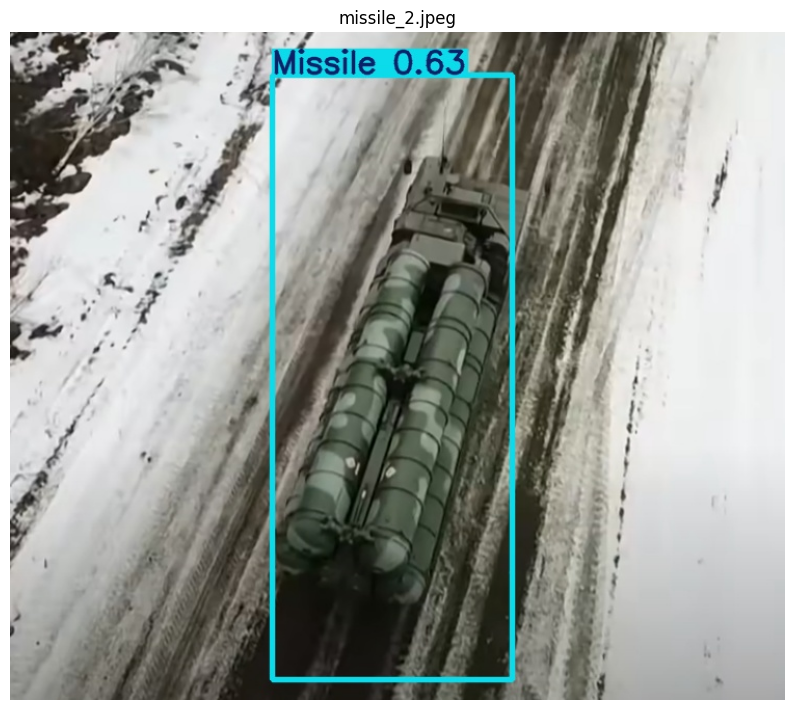

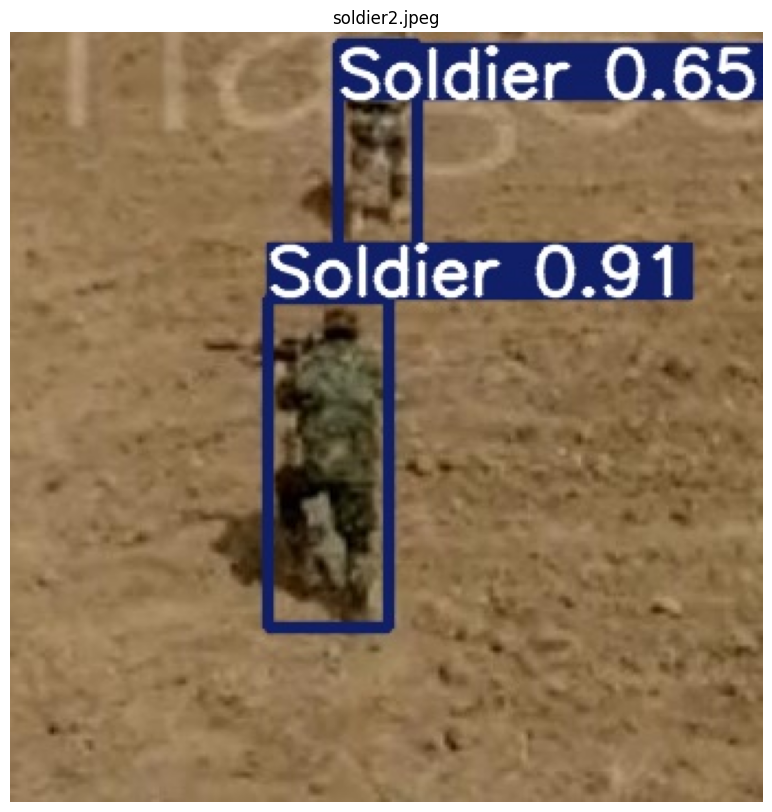

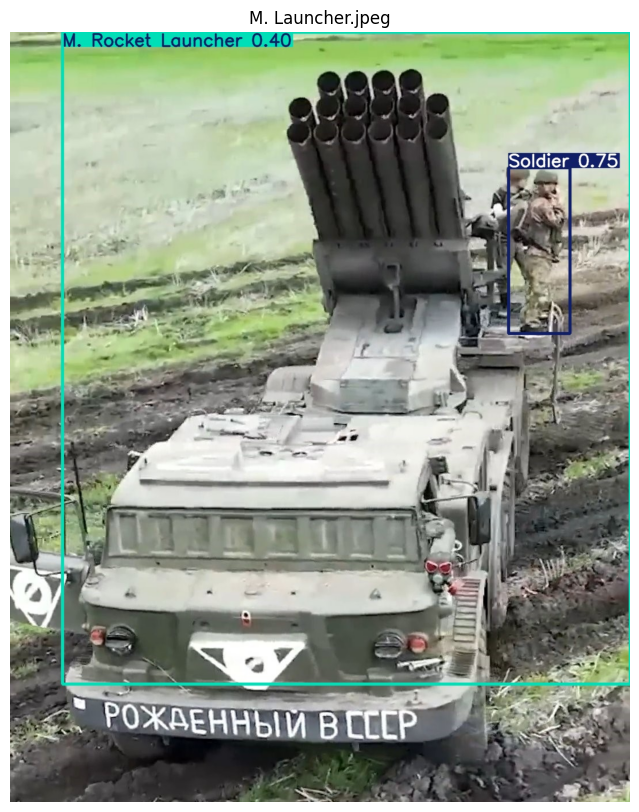

...

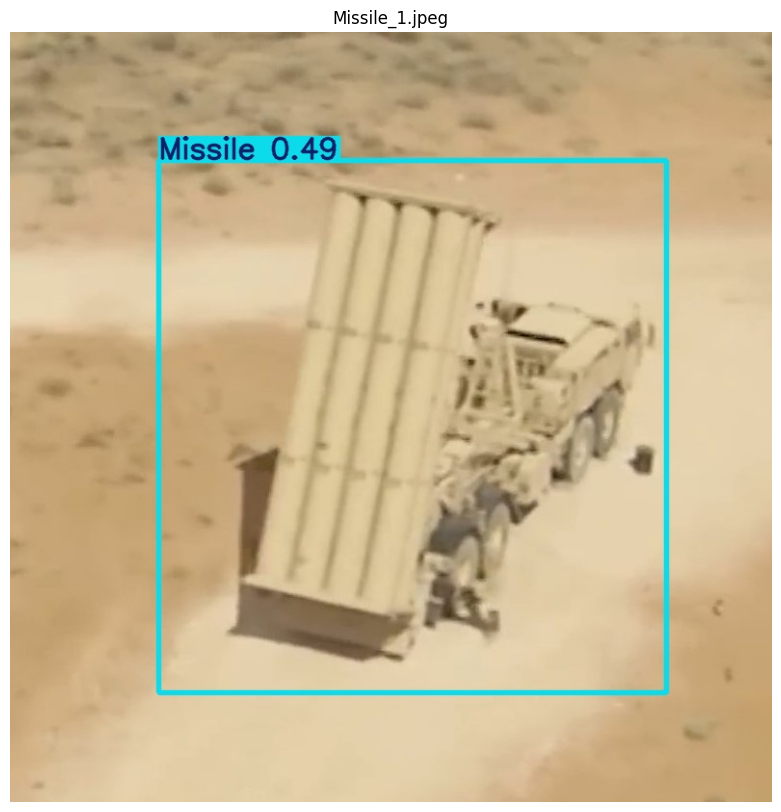

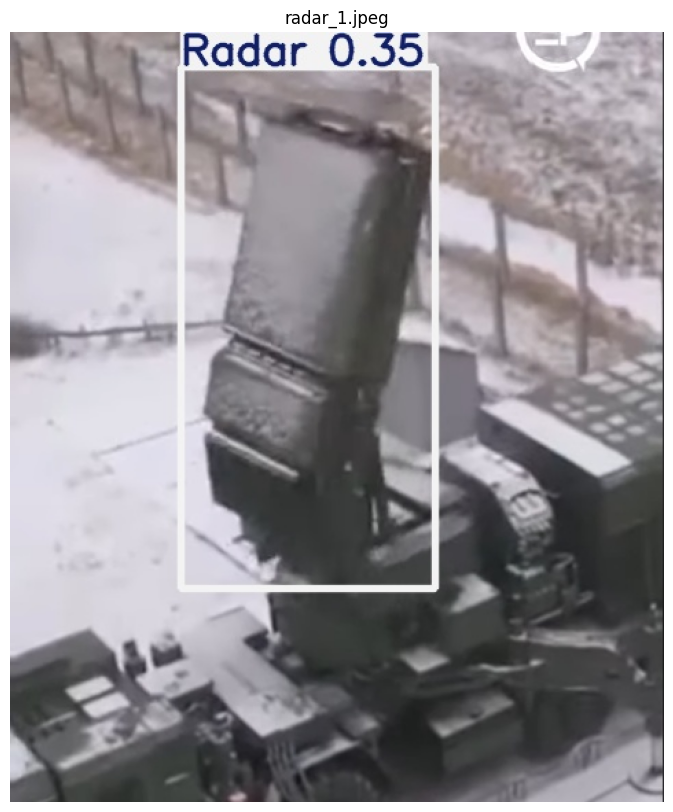

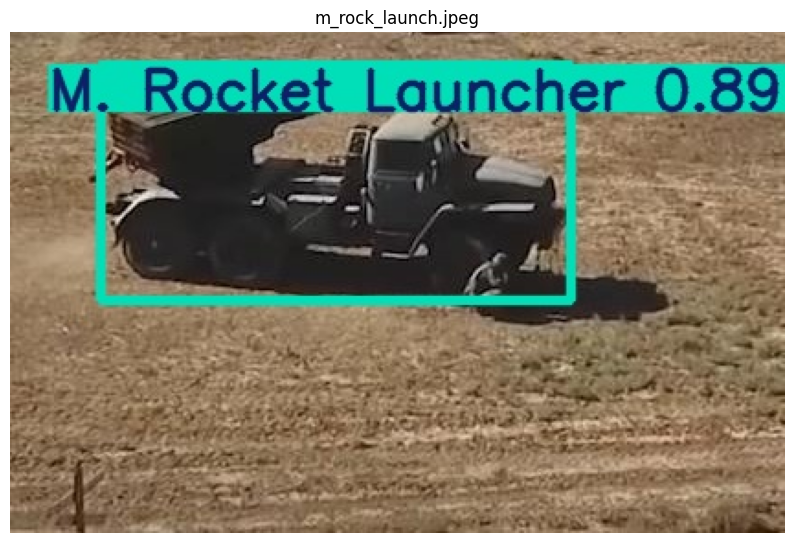

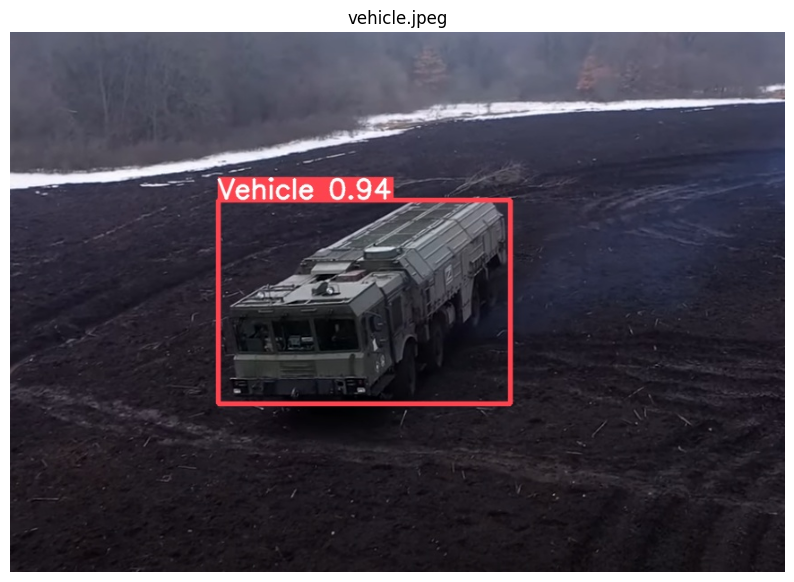

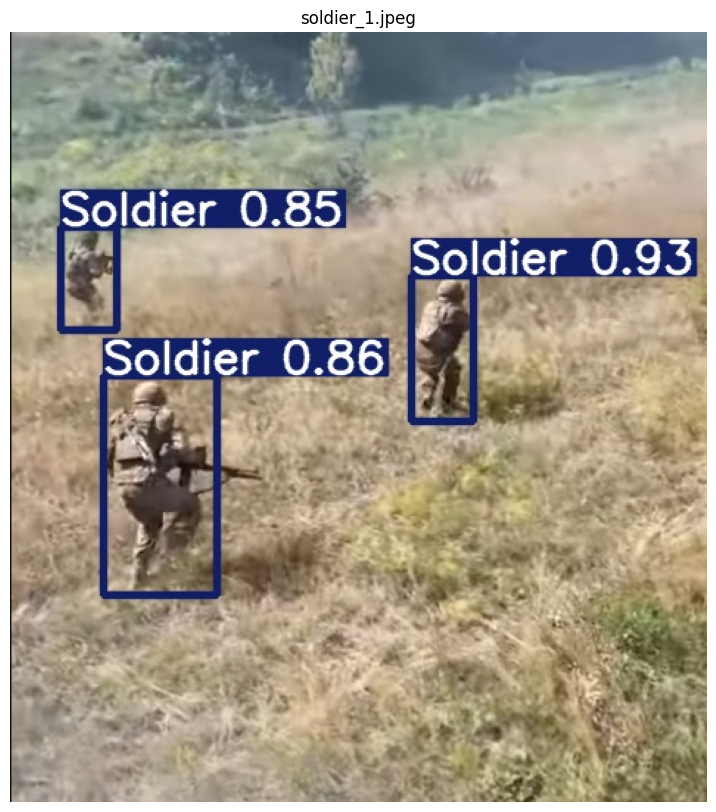

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

image_folder = 'runs/detect/exp8/'

image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.webp'))]


for image_file in image_files:
    img_path = os.path.join(image_folder, image_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    plt.show()